In [5]:
import os
os.getcwd()
os.chdir("G:/OneDrive/casa0010dissertation/00_06 jaipur code_mgwr")

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import geopandas as gpd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from time import time
import sys

In [7]:
# Basic plotting settings for matplotlib and seaborn
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl

import contextily as cx
from matplotlib.colors import Normalize

# Pandas display settings
pd.set_option('display.max_columns', None)

# Matplotlib basic settings
plt.style.use('default')
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
plt.rcParams['font.size'] = 16
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

# Matplotlib figure DPI setting
mpl.rcParams['figure.dpi'] = 300

# Seaborn settings
sns.set_style("darkgrid")
sns.set_context(context="paper", font_scale=1.5, rc=None)
sns.set(font="serif")

# Additional libraries for geo-spatial analysis (if needed)
import geopandas as gpd
import contextily as cx
from matplotlib.colors import Normalize

In [8]:
# 1. Load the data
gdf_with_epi =gpd.read_parquet("output/jaipur_economic_potential_index_plot.parquet")

In [9]:
gdf_with_epi.columns

Index(['hex_id', 'geometry', 'cover', 'transport_station_point',
       'transport_station_polygon', 'motorable_road_nexwork', 'amenities_poi',
       'office_poi', 'shop_poi', 'area_clip', 'pop_sum', 'builtup_sum',
       'ndvi_mean', 'ntl_mean', 'pop_density_km2', 'builtup_density',
       'PC1_Score_Original', 'PC1_Score_Corrected', 'PC2_Score', 'EPI_o',
       'EPI', 'EPI_o_Category', 'EPI_Category',
       'transport_station_point_transformed',
       'transport_station_polygon_transformed',
       'motorable_road_nexwork_transformed', 'amenities_poi_transformed',
       'office_poi_transformed', 'shop_poi_transformed',
       'pop_density_km2_transformed', 'builtup_density_transformed',
       'ndvi_mean_transformed', 'ntl_mean_transformed',
       'transport_station_point_standardized',
       'transport_station_polygon_standardized',
       'motorable_road_nexwork_standardized', 'amenities_poi_standardized',
       'office_poi_standardized', 'shop_poi_standardized',
       'pop

In [10]:
# 2. Define variables with standardized suffix (except ndvi_mean which was not standardized)
indicator_columns = [
    'transport_station_point_standardized',
    'transport_station_polygon_standardized',
    'motorable_road_nexwork_standardized',
    'amenities_poi_standardized',
    'office_poi_standardized',
    'shop_poi_standardized',
    'pop_density_km2_standardized',
    'builtup_density_standardized',
    'ndvi_mean_standardized',
    'ntl_mean_standardized'
]

col_name_map = {
    'transport_station_point_standardized': 'Transport Station',
    'transport_station_polygon_standardized': 'Transport Station(large)',
    'motorable_road_nexwork_standardized': 'Motorable Road',
    'amenities_poi_standardized': 'Amenities',
    'office_poi_standardized': 'Offices',
    'shop_poi_standardized': 'Shops',
    'pop_density_km2_standardized': 'Population',
    'builtup_density_standardized': 'Built-up Area',
    'ndvi_mean_standardized': 'NDVI',
    'ntl_mean_standardized': 'Nighttime Lights'
}

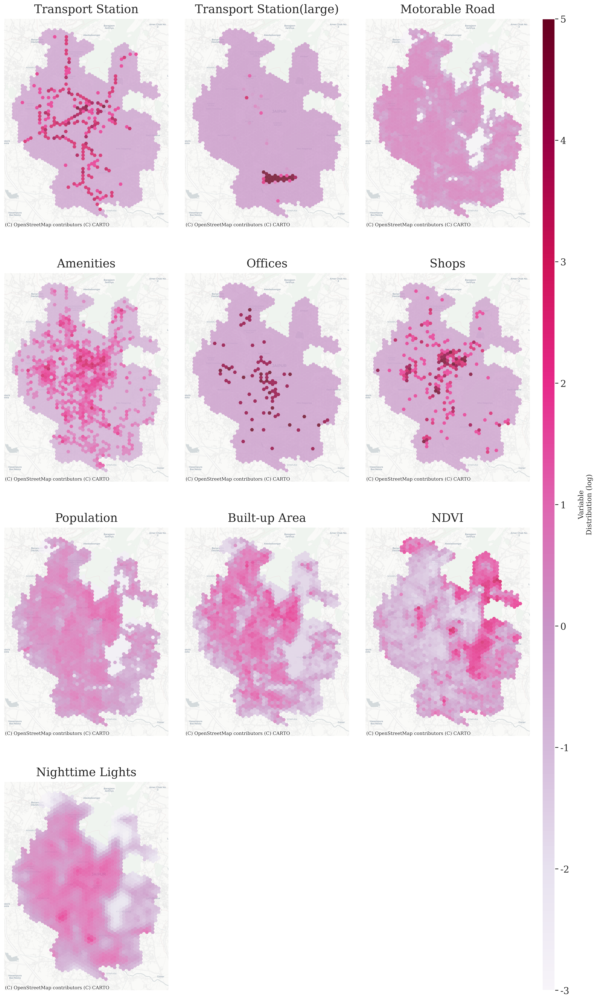

In [23]:
# Create 4x3 subplot layout for all ten variables
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 24))

# Calculate global min and max values across all variables for unified color scale
all_values = []
for col in indicator_columns:
    if col in gdf_with_epi.columns:
        values = gdf_with_epi[col].dropna()
        all_values.extend(values)

# Set fixed color scale range from -3 to +5
vmin, vmax = -3, 5
norm = Normalize(vmin=vmin, vmax=vmax)

# Set colormap to PuRd
cmap = plt.cm.PuRd

# Create map for each variable
for i, col in enumerate(indicator_columns):
    row = i // 3  # 计算行号
    col_idx = i % 3  # 计算列号
    ax = axes[row, col_idx]

    if col in gdf_with_epi.columns:
        # Ensure GeoDataFrame uses Web Mercator projection
        if gdf_with_epi.crs != 'EPSG:3857':
            gdf_projected = gdf_with_epi.to_crs('EPSG:3857')
        else:
            gdf_projected = gdf_with_epi.copy()

        # Plot geographic data
        gdf_projected.plot(
            column=col,
            ax=ax,
            cmap=cmap,
            norm=norm,
            edgecolor='none',
            alpha=0.8,
            legend=False
        )

        # Add basemap
        try:
            cx.add_basemap(ax,
                          crs=gdf_projected.crs,
                          source=cx.providers.CartoDB.Positron,
                          alpha=1)
        except Exception as e:
            print(f"Unable to add basemap: {e}")

        # Set title
        display_name = col_name_map.get(col, col)
        ax.set_title(display_name, pad=10, fontsize=20)

    else:
        # If column doesn't exist, show blank with message
        ax.text(0.5, 0.5, f'Column "{col}" not found',
               ha='center', va='center', transform=ax.transAxes,
               bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))
        ax.set_title(col_name_map.get(col, col), pad=10)

    # Remove axis ticks and labels
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Remove subplot borders/spines
    for spine in ax.spines.values():
        spine.set_visible(False)

# Hide the empty subplots in the fourth row (positions 2 and 3)
axes[3, 1].set_visible(False)
axes[3, 2].set_visible(False)

# Adjust layout with more spacing between maps
plt.tight_layout()
plt.subplots_adjust(right=0.85, wspace=0.1, hspace=0.2)

# Add shared colorbar on the right side
# Calculate the total height from top of first row to bottom of fourth row
pos_top = axes[0, 0].get_position()
pos_bottom = axes[3, 0].get_position()
total_height = pos_top.y1 - pos_bottom.y0

cbar_ax = fig.add_axes([0.87, pos_bottom.y0, 0.02, total_height])
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, cax=cbar_ax)
cbar.set_label('Variable\nDistribution (log)', rotation=90, labelpad=15)

# Set colorbar ticks for -3 to +5 range
ticks = [-3, -2, -1, 0, 1, 2, 3, 4, 5]
cbar.set_ticks(ticks)
cbar.set_ticklabels([f'{tick}' for tick in ticks])
cbar.ax.tick_params(labelsize=16)

# Save the figure
plt.savefig('image/process/indicator_maps.png', dpi=300, bbox_inches='tight')
plt.show()

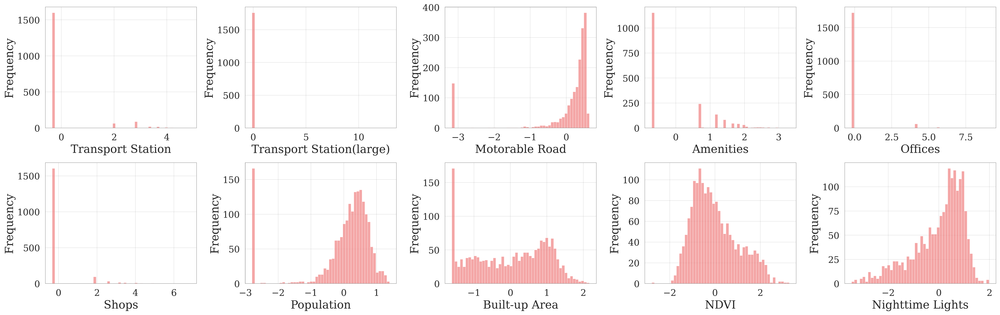

In [11]:
# 3. histogram

# Create subplots for 10 variables (2 rows, 5 columns)
fig, axes = plt.subplots(2, 5, figsize=(25, 8))
fig.patch.set_facecolor('white')

# Flatten axes array for easier indexing
axes = axes.flatten()

for i, col in enumerate(indicator_columns):
    axes[i].set_facecolor('white')

    # Set grid first so it appears behind the histogram
    axes[i].grid(True, alpha=0.3, color='gray', linestyle='-', linewidth=0.5)
    axes[i].set_axisbelow(True)  # Ensure grid is behind the histogram

    # Create histogram with white edges like your reference
    axes[i].hist(gdf_with_epi[col], bins=50, alpha=0.7, color='lightcoral',
                edgecolor='white', linewidth=0.5)

    # Get display name from mapping
    display_name = col_name_map.get(col, col.replace('_', ' ').title())

    # Set labels with 20pt font size
    axes[i].set_xlabel(f'{display_name}', fontsize=20)
    axes[i].set_ylabel('Frequency', fontsize=20)

    # Set tick labels to 16pt font size
    axes[i].tick_params(axis='x', labelsize=16)
    axes[i].tick_params(axis='y', labelsize=16)

    # Add subplot borders/spines to match your reference style
    for spine in axes[i].spines.values():
        spine.set_visible(True)
        spine.set_color('gray')
        spine.set_linewidth(0.5)

plt.tight_layout()
plt.savefig('image/process/standardized_indicators_histograms.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()